In [38]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np

In [2]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [3]:
print(raw_train)
print(raw_validation)
print(raw_test)
print(len(raw_train))
print(len(raw_train)*10 / 8)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
2936
3670.0


In [4]:
%matplotlib inline
# 해상도 높이기
%config InlineBackend.figure_format = 'retina'

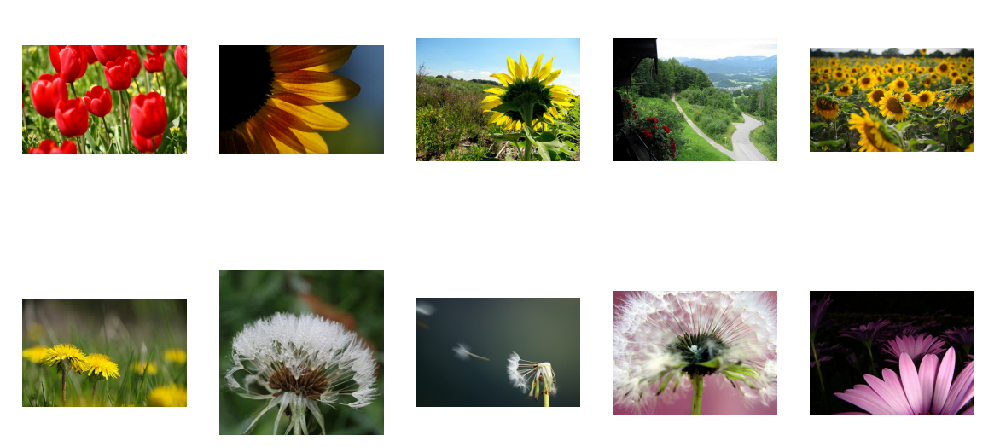

In [5]:
plt.figure(figsize=(10, 5))
get_label_name = metadata.features['label'].int2str

# take = tf.data.dataset에서 제공 / 인수로 받은 숫자만큼의 데이터를 추출하여 새로운 데이터셋 인스턴스를 생성하여 리턴
for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}',  color = 'white')
    plt.axis('off')

In [23]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/255)
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [24]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

In [25]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

직접 만든 모델
=========
    - 트레이닝 acc : 93%
    - 테스트 acc : 66%

In [26]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

In [27]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 25600)            

In [28]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [29]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validatrain_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)tion_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [30]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 20s 218ms/step - loss: 1.4229 - accuracy: 0.3971 - val_loss: 1.4999 - val_accuracy: 0.3842
Epoch 2/10
92/92 [==============================] - 20s 218ms/step - loss: 1.1571 - accuracy: 0.5242 - val_loss: 1.1304 - val_accuracy: 0.5613
Epoch 3/10
92/92 [==============================] - 20s 218ms/step - loss: 1.0523 - accuracy: 0.5845 - val_loss: 1.1283 - val_accuracy: 0.5722
Epoch 4/10
92/92 [==============================] - 20s 218ms/step - loss: 0.9594 - accuracy: 0.6332 - val_loss: 1.0647 - val_accuracy: 0.5940
Epoch 5/10
92/92 [==============================] - 20s 218ms/step - loss: 0.8586 - accuracy: 0.6703 - val_loss: 0.9853 - val_accuracy: 0.6403
Epoch 6/10
92/92 [==============================] - 20s 219ms/step - loss: 0.7973 - accuracy: 0.7037 - val_loss: 1.0394 - val_accuracy: 0.6022
Epoch 7/10
92/92 [==============================] - 20s 221ms/step - loss: 0.7100 - accuracy: 0.7388 - val_loss: 1.0414 - val_accuracy: 0.6131

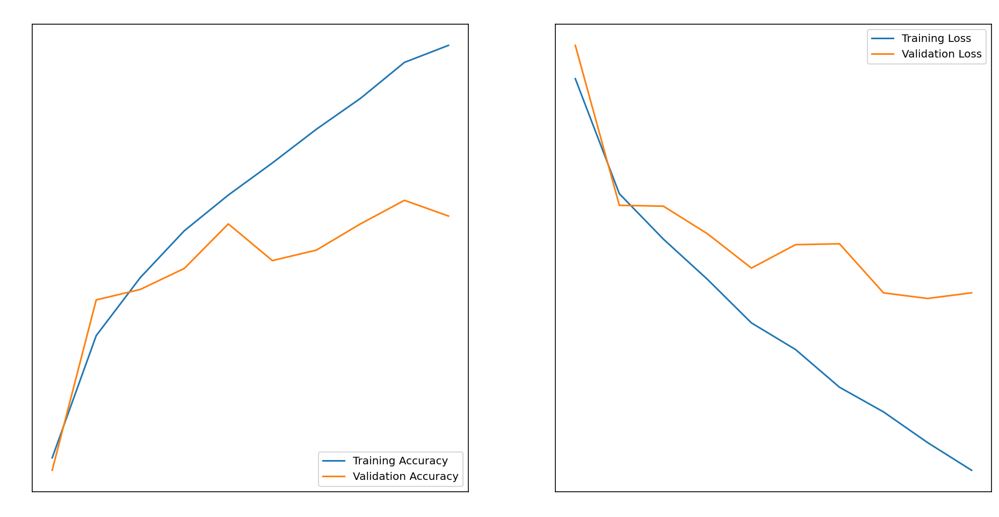

In [37]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss=history.history['loss']
val_loss=history.history['val_loss']

with plt.rc_context({'xtick.color':'white', 'ytick.color':'white',}):

    epochs_range = range(EPOCHS)

    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy', color = 'white')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss', color = 'white')
    plt.show()

In [44]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

In [46]:
predictions = np.argmax(predictions, axis=1)
predictions

array([3, 0, 0, 2, 0, 1, 2, 2, 3, 0, 0, 3, 3, 2, 0, 3, 2, 0, 1, 4, 2, 0,
       1, 0, 1, 0, 1, 1, 2, 3, 0, 0])

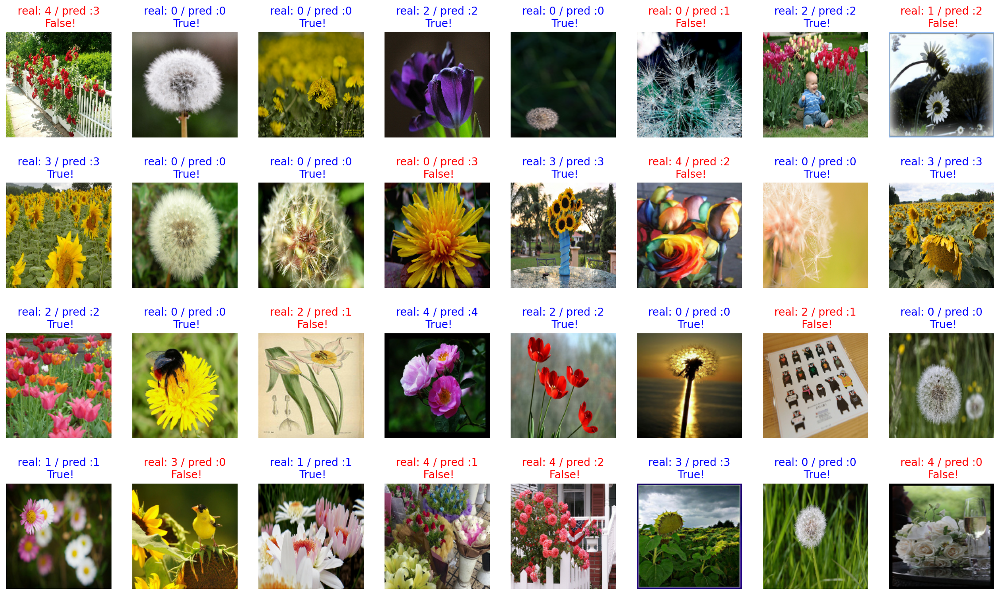

In [47]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [48]:
count = 0   # 정답을 맞춘 개수
total = 0
for image, label, prediction in zip(images, labels, predictions):
    total += 1
    if  label == prediction:
        count += 1
print(count / total)

0.65625


VGGnet 튜닝 모델
=========
- base acc : 0.74 test acc : 0.88
- epoch의 변화에 따른 학습률 변화
    - history2의 변화에서 확인할 수 있는 것처럼 5 이상의 경우 과적합
    - epoch는 5가 최적의 값임을 확인
    

In [50]:
# IMG_SIZE = 160
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [51]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [53]:
# base_model의 학습 여부를 결정
base_model.trainable = False

global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [54]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [55]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
92/92 [==============================] - 84s 915ms/step - loss: 1.3902 - accuracy: 0.5068 - val_loss: 1.2105 - val_accuracy: 0.6294
Epoch 2/5
92/92 [==============================] - 87s 942ms/step - loss: 1.1137 - accuracy: 0.6601 - val_loss: 1.0201 - val_accuracy: 0.6785
Epoch 3/5
92/92 [==============================] - 87s 947ms/step - loss: 0.9581 - accuracy: 0.7040 - val_loss: 0.8971 - val_accuracy: 0.6948
Epoch 4/5
92/92 [==============================] - 87s 950ms/step - loss: 0.8596 - accuracy: 0.7306 - val_loss: 0.8284 - val_accuracy: 0.7166
Epoch 5/5
92/92 [==============================] - 87s 949ms/step - loss: 0.7933 - accuracy: 0.7415 - val_loss: 0.7943 - val_accuracy: 0.7275


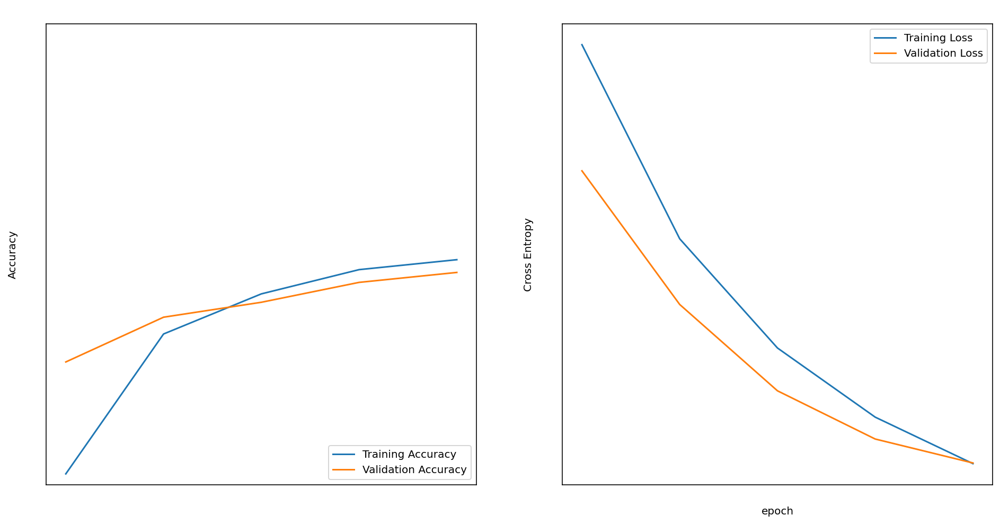

In [57]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

with plt.rc_context({'xtick.color':'white', 'ytick.color':'white',}):
    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.plot(acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    plt.ylim([min(plt.ylim()),1])
    plt.title('Training and Validation Accuracy', color = 'white')

    plt.subplot(1, 2, 2)
    plt.plot(loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    plt.title('Training and Validation Loss', color = 'white')
    plt.xlabel('epoch')
    plt.show()

In [60]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 2, 4, 4, 3, 0, 4])

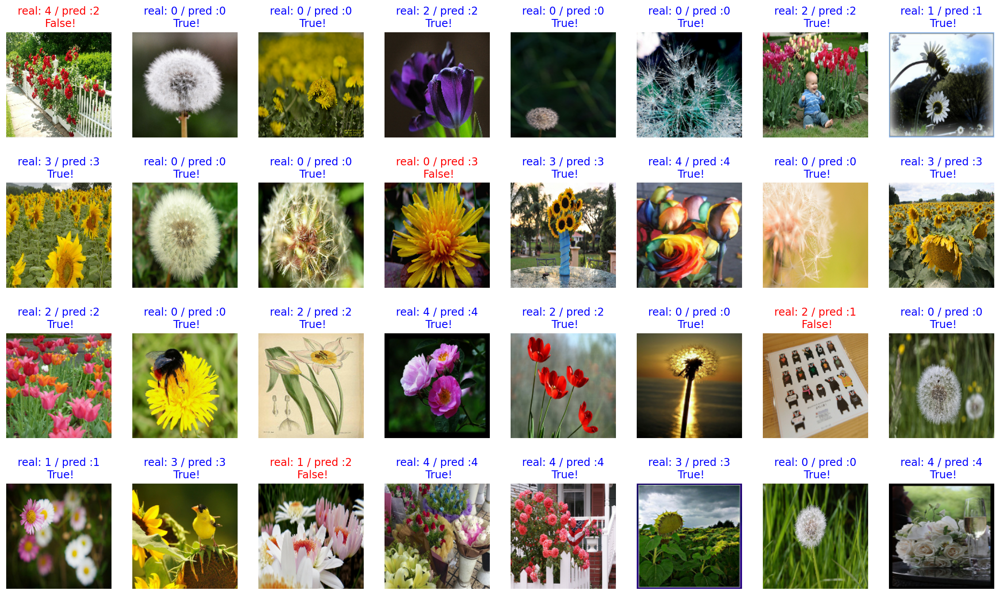

In [61]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [62]:
count = 0   # 정답을 맞춘 개수
total = 0
for image, label, prediction in zip(images, labels, predictions):
    total += 1
    if  label == prediction:
        count += 1
print(count / total)

0.875


In [58]:
model2 = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
base_learning_rate = 0.0001
model2.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

EPOCHS = 10   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history2 = model2.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 83s 898ms/step - loss: 0.7424 - accuracy: 0.7554 - val_loss: 0.7435 - val_accuracy: 0.7384
Epoch 2/10
92/92 [==============================] - 85s 923ms/step - loss: 0.7047 - accuracy: 0.7684 - val_loss: 0.7178 - val_accuracy: 0.7357
Epoch 3/10
92/92 [==============================] - 85s 923ms/step - loss: 0.6738 - accuracy: 0.7790 - val_loss: 0.6944 - val_accuracy: 0.7411
Epoch 4/10
92/92 [==============================] - 88s 955ms/step - loss: 0.6497 - accuracy: 0.7851 - val_loss: 0.6821 - val_accuracy: 0.7575
Epoch 5/10
92/92 [==============================] - 87s 947ms/step - loss: 0.6283 - accuracy: 0.7905 - val_loss: 0.6592 - val_accuracy: 0.7711
Epoch 6/10
92/92 [==============================] - 85s 921ms/step - loss: 0.6119 - accuracy: 0.7963 - val_loss: 0.6454 - val_accuracy: 0.7684
Epoch 7/10
92/92 [==============================] - 83s 906ms/step - loss: 0.5947 - accuracy: 0.8001 - val_loss: 0.6352 - val_accuracy: 0.7711

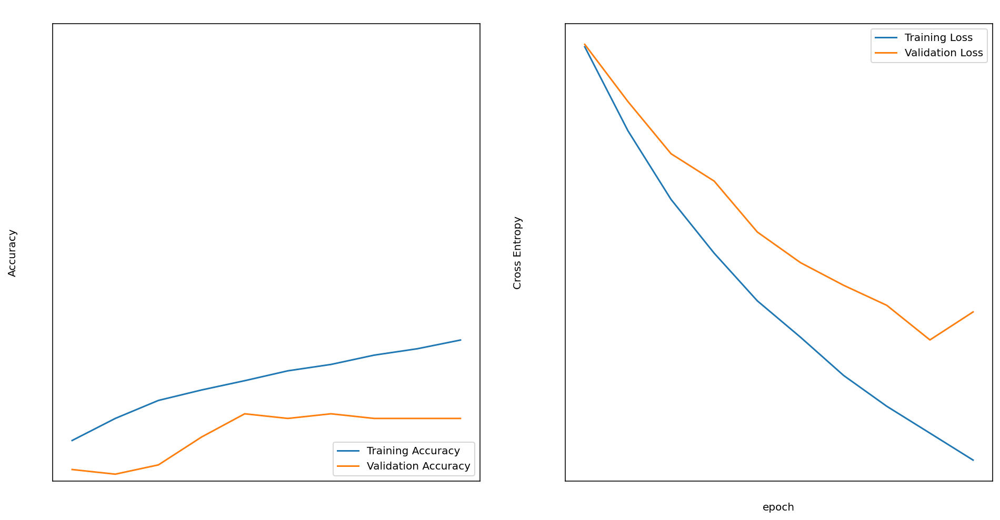

In [59]:
acc = history2.history['accuracy']
val_acc = history2.history['val_accuracy']
loss = history2.history['loss']
val_loss = history2.history['val_loss']

with plt.rc_context({'xtick.color':'white', 'ytick.color':'white',}):
    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.plot(acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    plt.ylim([min(plt.ylim()),1])
    plt.title('Training and Validation Accuracy', color = 'white')

    plt.subplot(1, 2, 2)
    plt.plot(loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    plt.title('Training and Validation Loss', color = 'white')
    plt.xlabel('epoch')
    plt.show()